# Poisson regression (GAM) COVID-19 Prediction

In [1]:
# Data manipulation
import numpy as np
import pandas as pd

pd.options.display.max_columns = None
pd.options.display.max_colwidth = 500

# Data viz
import matplotlib.pyplot as plt
import plotly
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns

sns.set(style="darkgrid", rc={"figure.figsize": (11.7, 8.27)})

# Modeling
from pygam import PoissonGAM, s, l, f

# Other
from datetime import date, timedelta
import os
import random
import sys

# Custom module
module_path = os.path.abspath(os.path.join("../src"))
if module_path not in sys.path:
    sys.path.append(module_path)

from evaluation import time_series_cross_val_scores
from plotting import plot_predictions
from stem_poisson_gam import *
from utils import get_covid_data, get_all_covid_data

# Reload imported code
%reload_ext autoreload
%autoreload 2

# Print all output
from IPython.core.interactiveshell import InteractiveShell

InteractiveShell.ast_node_interactivity = "all"

# Set seeds for reproducibility
rand_seed = 2
np.random.seed(rand_seed)
random.seed(rand_seed)

In [37]:
date.today().strftime('%d-%m-%Y')

'03-02-2021'

## About

The goal is to provide the most accurate forecasts for COVID-19 in Canada for new cases, deaths and recovered cases.  We'll be using an approach similar to that in the paper [Spatiotemporal Dynamics, Nowcasting and Forecasting of COVID-19 in the United States](https://arxiv.org/abs/2004.14103) which uses a generalized additive model with Poisson distribution using temporal variables (number of infected, susceptible cases at time $t-1$), spatial coordinates, time varying covariates (control measures), and constant covariates (demographic, economic, etc). For now we only use temporal variables $I_{it}$ and $Z_{it}$.

## Load data and EDA

**Given variables**
- $Y_{it}$: Current number of new case at time t for area i. Column "cases" in cases_timeseries_prov.csv
- $I_{it}$: Cumulative number of active infectious cases. Column "active_cases" in active_timeseries_prov.csv
- $C_{it}$: Cumulative confirmed cases up to time t. Column "cumulative_cases" in active_timeseries_prov.csv
- $R_{it}$: Cumulative number of infections. Column "cumulative_recovered" in active_timeseries_prov.csv

**Transformed variables**
- $N_{i}$: Population of region i. Column "population"
- $\Delta D_{it}$: New deaths/recovered cases at time t. Column "removed"
- $S_{it}$: Number of susceptible subjects at time t defined by $S_{it} = N_i - C_{it}$. Column "susceptible"
- $Z_{it}$: Log ratio of susceptible subjects $Z_{it} = log(S_{it} / N_i)$. Column "percent_susceptible" without log transform.

In [2]:
# # Read in data
active_cases_provinces = get_all_covid_data(level='prov', preprocess=True)

# Remove outlier for quebec
active_cases_provinces.loc[active_cases_provinces['removed'] == 23687, 'removed'] = 1

# Get first and last day of reports
start_date = active_cases_provinces["date"].min()
end_date = active_cases_provinces["date"].max()

# Get list of provinces
provinces = active_cases_provinces["province"].unique()

# Show dataframe
active_cases_provinces.head(10)

,province,date,cumulative_cases,cumulative_recovered,cumulative_deaths,active_cases,active_cases_change,deaths,recovered,cases,population,removed,cumulative_removed,susceptible,percent_susceptible
0,Alberta,2020-01-25,0,0,0,0,0,0,0,0,4421876,0,0,4421876,1.0
1,Alberta,2020-01-26,0,0,0,0,0,0,0,0,4421876,0,0,4421876,1.0
2,Alberta,2020-01-27,0,0,0,0,0,0,0,0,4421876,0,0,4421876,1.0
3,Alberta,2020-01-28,0,0,0,0,0,0,0,0,4421876,0,0,4421876,1.0
4,Alberta,2020-01-29,0,0,0,0,0,0,0,0,4421876,0,0,4421876,1.0
5,Alberta,2020-01-30,0,0,0,0,0,0,0,0,4421876,0,0,4421876,1.0
6,Alberta,2020-01-31,0,0,0,0,0,0,0,0,4421876,0,0,4421876,1.0
7,Alberta,2020-02-01,0,0,0,0,0,0,0,0,4421876,0,0,4421876,1.0
8,Alberta,2020-02-02,0,0,0,0,0,0,0,0,4421876,0,0,4421876,1.0
9,Alberta,2020-02-03,0,0,0,0,0,0,0,0,4421876,0,0,4421876,1.0


In [3]:
# Remove data before March 8
remove_date = date(day=8, month=3, year=2020)
active_cases_provinces = active_cases_provinces.query("date >= @remove_date")

# Ignore provinces with very little cases
provinces_ignore = ['PEI', 'New Brunswick', 'NWT', 'NL', 'Nova Scotia', 'Nunavut', 'Yukon']
active_cases_provinces = active_cases_provinces.query("province not in @provinces_ignore").reset_index(drop=True)

provinces = active_cases_provinces['province'].unique()

### Comments

- Mortality data starts March 8, 2020 so we will just ignore all dates before March 1. 

## Poisson regression

We'll be applying a similar but simpler version of the poisson regression as proposed in the paper mentioned above. Currently it only accounts for temporal effects. For a given province $i$ we have the new cases modelled as 

$$
Y_t \sim Poisson(\mu_t) \\
log(\mu_t) = \beta_{0} + \beta_{1}log(I_{t-1} + 1) + \beta_3 (S_{t-1}/N) 
$$

and the new deaths/recovered modelled as 

$$
\Delta D_t \sim Poisson({\mu_t}^D) \\
log({\mu_t}^D) = \beta_{1}^D + \beta_{2}^D log(I_{t-1} + 1)
$$

In [4]:
# Preprocess all province data
active_cases_provinces_preprocessed = preprocess_data(active_cases_provinces, drop_first_day=True)

In [10]:
# Fit model and get 3 week forecasts for each province for every province
h = 21
forecasts = pd.DataFrame()

for province in provinces:
    # Get province data
    province_data = active_cases_provinces_preprocessed.query('province == @province')
    X = province_data
    Y = province_data[['province', 'date', 'cases', 'removed']]
    
    # Fit model
    model = StemPoissonRegressor()
    model.fit(X, Y)
    
    # Get forecasts
    province_forecasts = model.forecast(h=h)
    province_forecasts = province_forecasts.merge(province_data, how='left', on=['province', 'date'])
    forecasts = pd.concat([forecasts, province_forecasts], ignore_index=True)

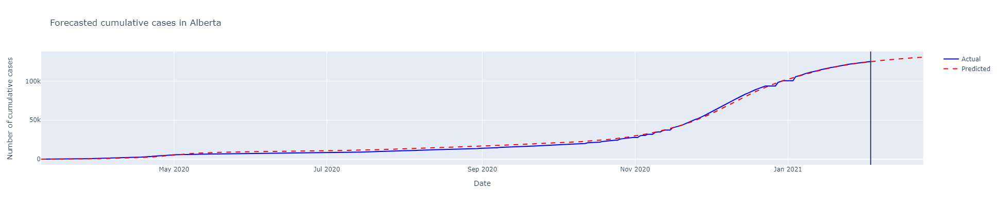

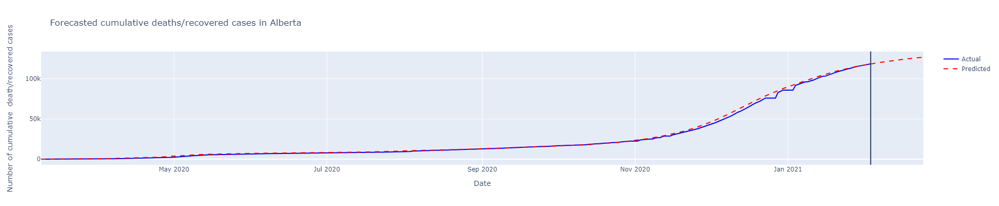

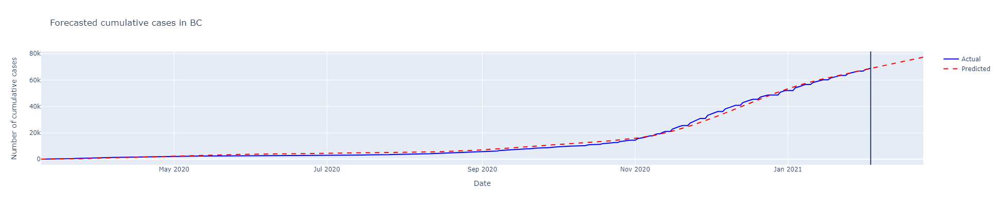

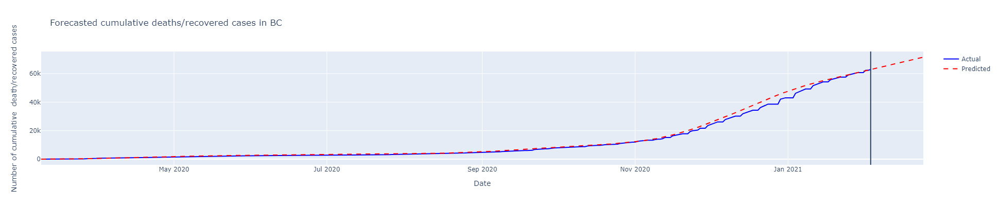

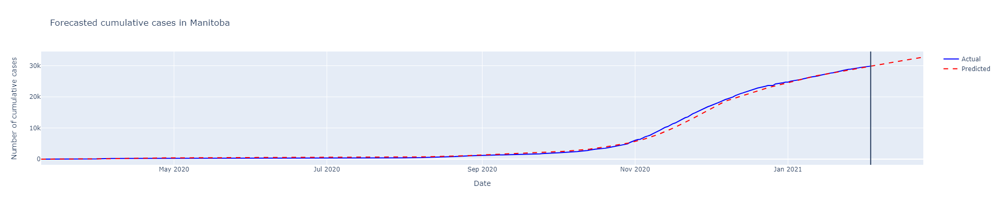

...

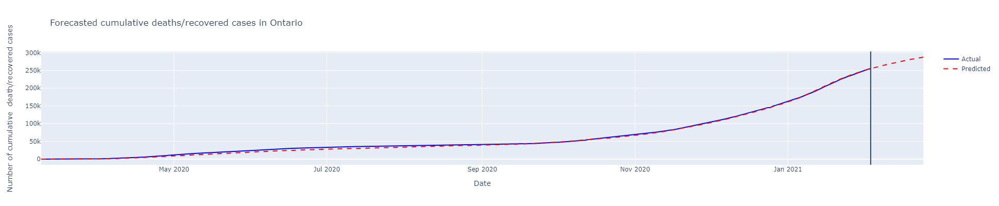

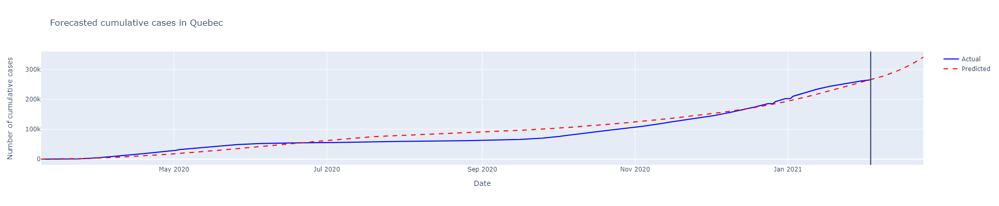

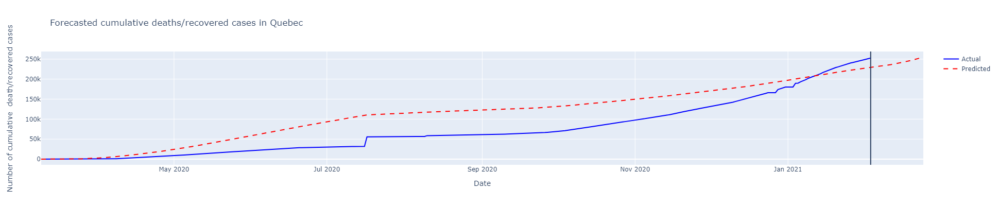

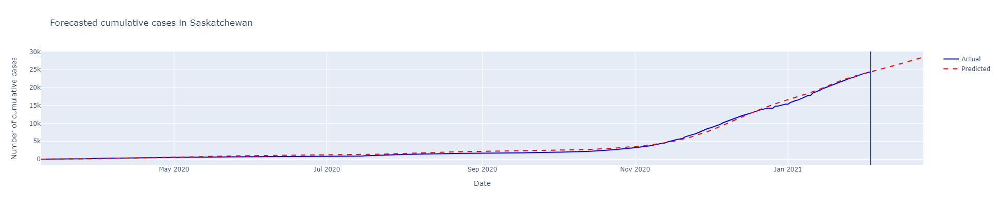

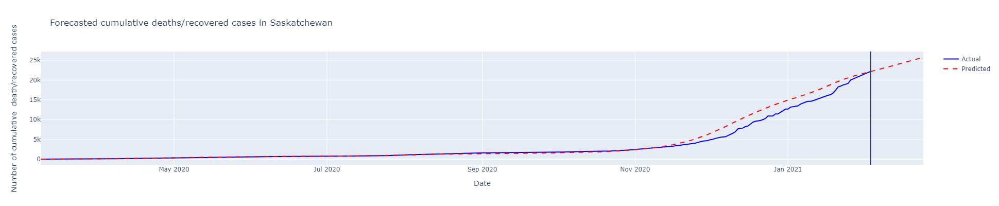

In [14]:
# Predictions plots for cumulative cases and removed
for province in provinces:
    province_forecasts = forecasts.query('province == @province')
    
    plot_predictions(province_forecasts,
                     y = 'cumulative_cases',
                     y_label = 'Number of cumulative cases',
                     title = f'Forecasted cumulative cases in {province}',
                     include_ci = False)

    plot_predictions(province_forecasts,
                     y = 'cumulative_removed',
                     y_label = 'Number of cumulative  death/recovered cases',
                     title = f'Forecasted cumulative deaths/recovered cases in {province}',
                     include_ci = False)

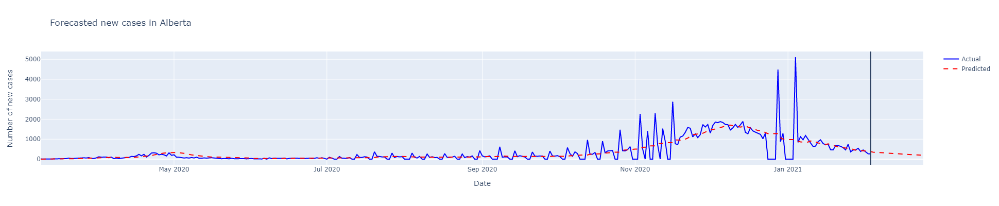

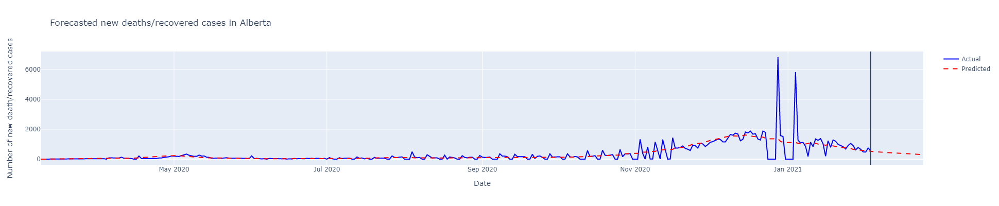

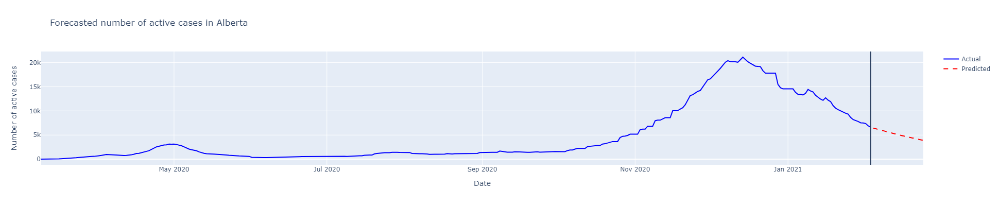

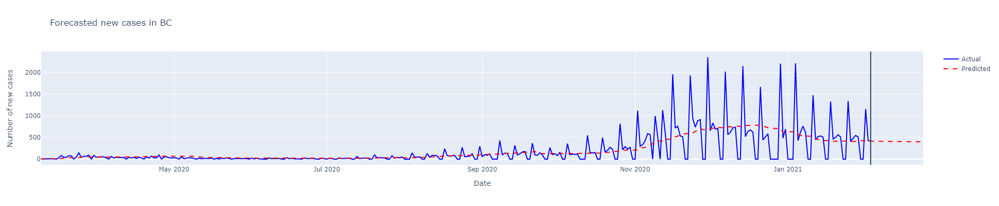

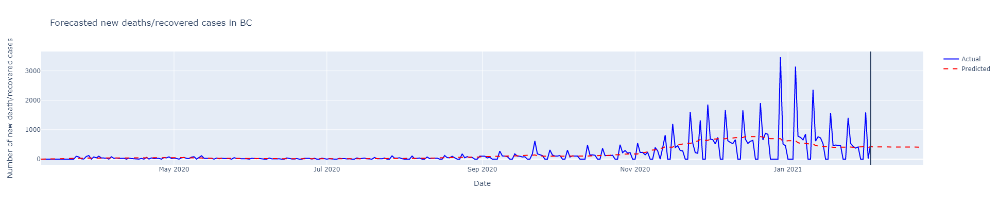

...

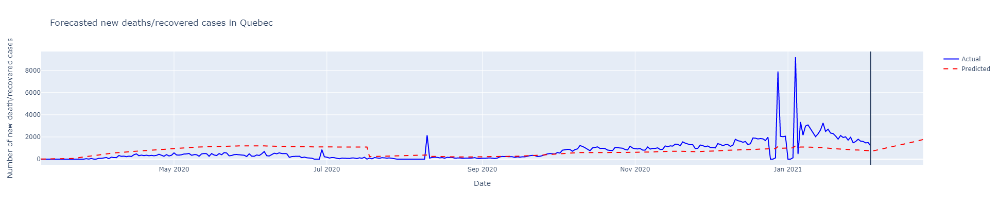

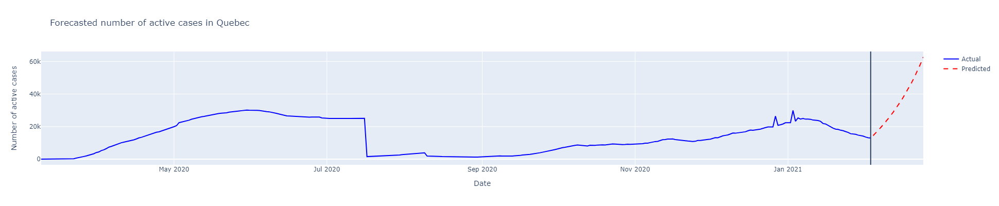

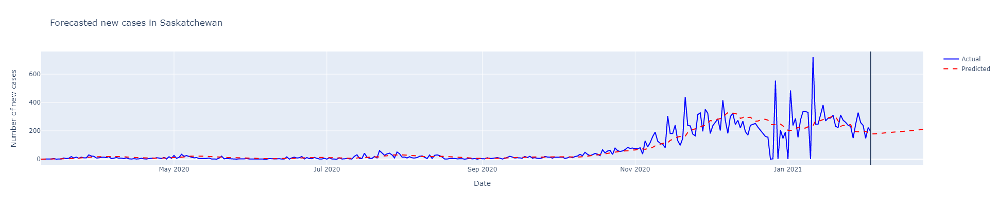

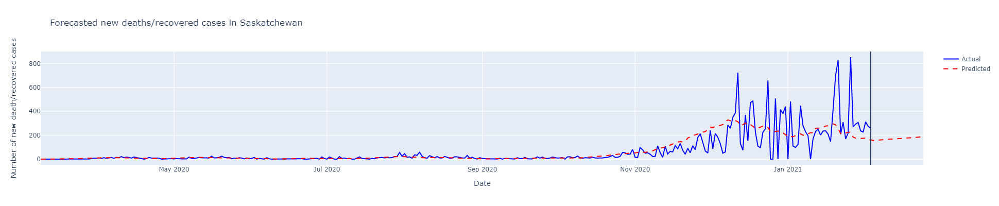

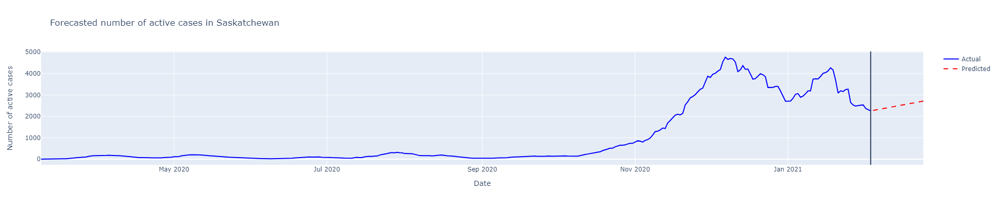

In [11]:
# Prediction plots for all provinces
for province in provinces:
    province_forecasts = forecasts.query('province == @province')
    
    plot_predictions(province_forecasts,
                     y = 'cases',
                     y_label = 'Number of new cases',
                     title = f'Forecasted new cases in {province}',
                     include_ci = False)

    plot_predictions(province_forecasts,
                     y = 'removed',
                     y_label = 'Number of new death/recovered cases',
                     title = f'Forecasted new deaths/recovered cases in {province}',
                     include_ci = False)
    
    plot_predictions(province_forecasts,
                     y = 'active_cases',
                     y_label = 'Number of active cases',
                     title = f'Forecasted number of active cases in {province}')

### Comments
- Overall the forecasts and fitted curves seem to fit the actual data ok. Though for some provinces it seems like the forecasts are too high for active cases and new removed cases
- For quebec there's huge drop in predicted cases on July 18 most likely caused from the huge drop in active cases in Quebec. The noise in the data is effecting the performance of the model too much

## Poisson regression Combined Model (removed)

Similar to the above model. The combined poisson regression model has all province temporal variables as predictors. For example, for Ontario we use previous day information for Ontario as well as Alberta, BC, Manitoba, etc in order to predict the next day new cases and new removed. For Ontario for example, we model the new cases as 

$$
Y_t \sim Poisson(\mu_t) \\
log(\mu_t) = \beta_{1t} + \beta_{2t}log(I_{BC, t-1} + 1) + \alpha_tlog(S_{BC, t-1}/N) + \beta_{2t}log(I_{QC, t-1} + 1) + \alpha_tlog(S_{QC, t-1}/N) + ...
$$

and the model for new removed cases as

$$
\Delta D_t \sim Poisson({\mu_t}^D) \\
log({\mu_t}^D) = \beta_{1t}^D + \beta_{2t}^D log(I_{BC, t-1} + 1) + \beta_{2t}^D log(I_{QC, t-1} + 1) + ...
$$

For the variables corresponding to all other provinces than current one in model we also place higher regularization on those parameters so the variables relating to the given province have higher effect.

In [7]:
# Preprocess data
active_cases_provinces_preprocessed = preprocess_data(active_cases_provinces, add_province_columns=True, drop_first_day=True)

In [8]:
# Fit model
model = StemPoissonRegressorCombined(lam_main=0.6, lam_other=100)
model.fit(X, Y)

In [9]:
# Get 3 week forecasts
forecasts = model.forecast(h=21)
forecasts = forecasts.merge(active_cases_provinces, how='left', on=['province', 'date'])

forecasts.tail(10)

,province,date,active_cases_pred,cases_pred,removed_pred,is_forecast,cumulative_cases,cumulative_recovered,cumulative_deaths,active_cases,active_cases_change,deaths,recovered,cases,population,removed,cumulative_removed,susceptible,percent_susceptible
325,Saskatchewan,2021-01-28,4042.856375,281.788673,281.802706,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
326,Saskatchewan,2021-01-29,4042.841966,281.787448,281.801857,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
327,Saskatchewan,2021-01-30,4042.827182,281.786200,281.800984,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
328,Saskatchewan,2021-01-31,4042.812023,281.784930,281.800089,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
329,Saskatchewan,2021-02-01,4042.796487,281.783636,281.799172,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
330,Saskatchewan,2021-02-02,4042.780575,281.782320,281.798231,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
331,Saskatchewan,2021-02-03,4042.764288,281.780981,281.797268,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
332,Saskatchewan,2021-02-04,4042.747624,281.779618,281.796282,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
333,Saskatchewan,2021-02-05,4042.730584,281.778234,281.795274,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
334,Saskatchewan,2021-02-06,4042.713167,281.776826,281.794242,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


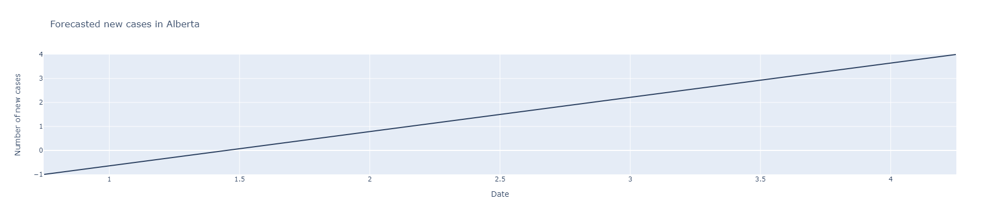

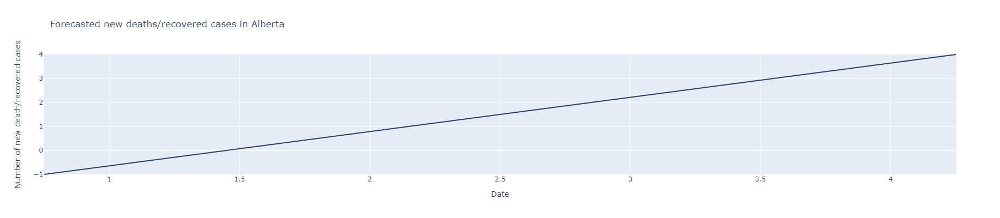

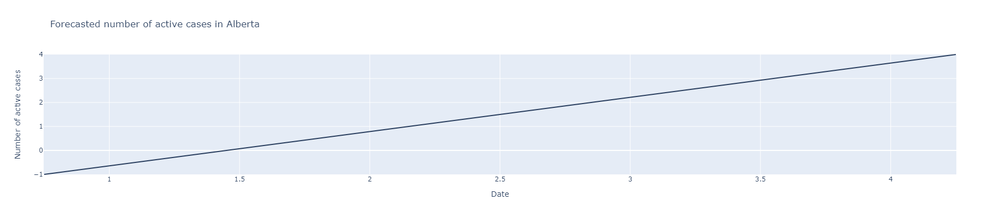

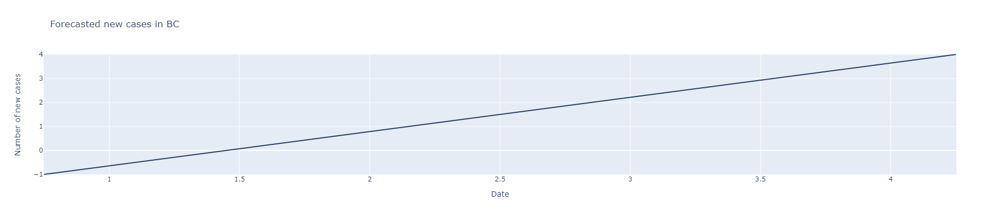

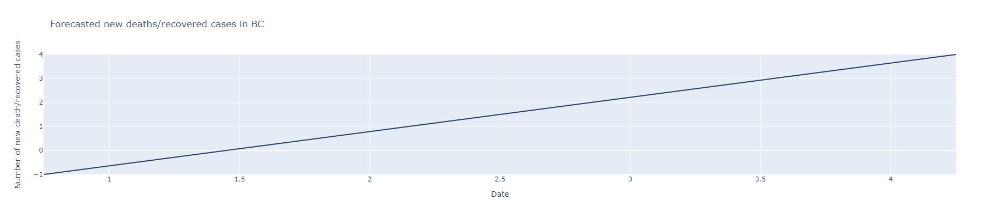

...

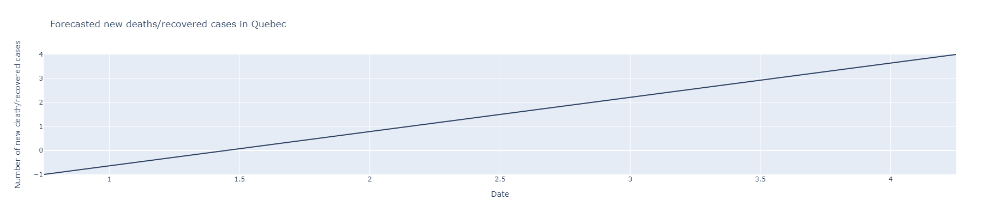

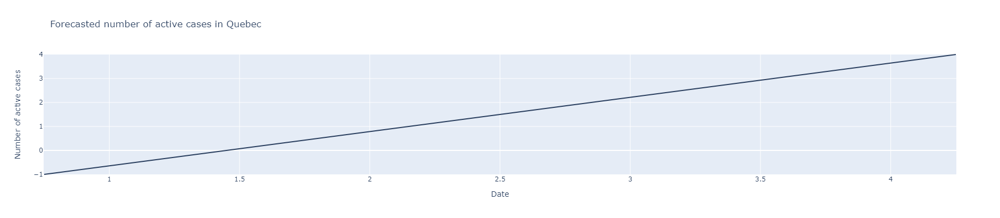

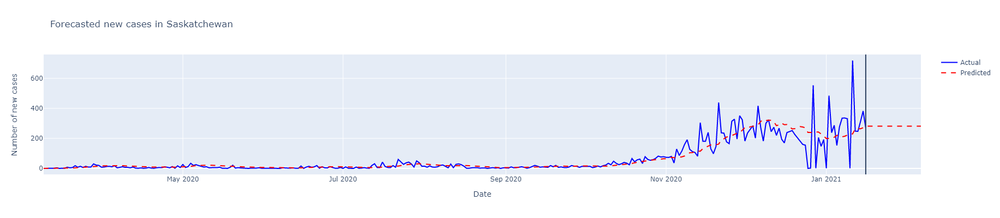

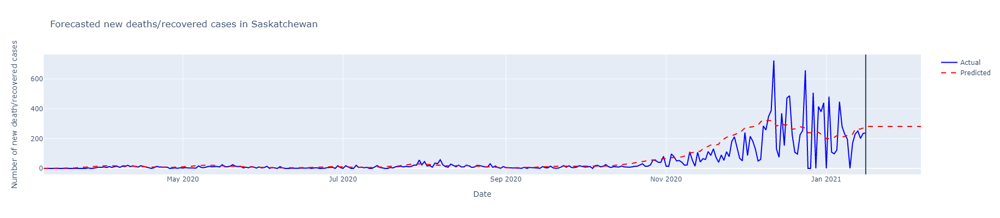

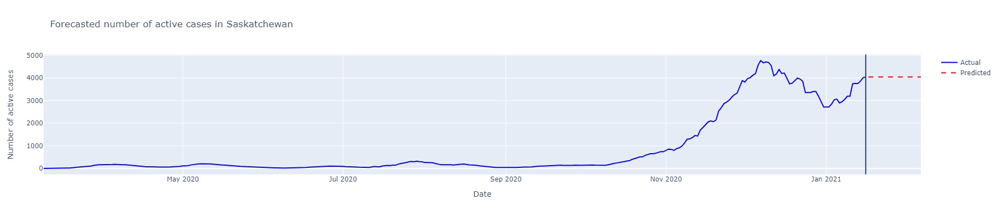

In [10]:
# Prediction plots for all provinces
provinces = active_cases_provinces['province'].unique()
for province in provinces:
    province_forecasts = forecasts.query('province == @province')
    
    plot_predictions(province_forecasts,
                     y = 'cases',
                     y_label = 'Number of new cases',
                     title = f'Forecasted new cases in {province}',
                     include_ci = False)

    plot_predictions(province_forecasts,
                     y = 'removed',
                     y_label = 'Number of new death/recovered cases',
                     title = f'Forecasted new deaths/recovered cases in {province}',
                     include_ci = False)
    
    plot_predictions(province_forecasts,
                     y = 'active_cases',
                     y_label = 'Number of active cases',
                     title = f'Forecasted number of active cases in {province}')

### Comments
- Compared to the single model case these ones give very flat forecasts
- Coefficients for all provinces for a given model are significant and their magnitude is just as large as the coefficient for the given province. This could be that the province data follow similar patterns, not linearly independent data, which can explain these results

## Poisson regression with time varying parameters

Similar to the poisson regression above however we include parameters that depend on time. This is to allow for a more flexible model that changes. This is defined for a simple example as shown

$$
Y_t \sim Poisson(\mu_t) \\
\text{If} ~~ t \leq c_1 \\
log(\mu_t) = \beta_{0} + \beta_{1,0}log(I_{t-1} + 1) + \beta_{2,0} log(S_{t-1}/N) \\
\text{else} \\
log(\mu_t) = \beta_{0} + \beta_{1,1}log(I_{t-1} + 1) + \beta_{2,1} log(S_{t-1}/N)
$$

and the new deaths/recovered modelled as 

$$
\Delta D_t \sim Poisson({\mu_t}^D) \\
log({\mu_t}^D) = \beta_{1}^D + \beta_{2}^D log(I_{t-1} + 1)
$$

In [18]:
# Preprocess all province data
active_cases_provinces_preprocessed = preprocess_data(active_cases_provinces, drop_first_day=True)

# Split date under different policies
date_splits = [date(year=2020, month=3, day=9), date(year=2020, month=9, day=1), date(year=2020, month=12, day=15), date(year=2021, month=1, day=3)]

In [19]:
# Fit model and get 3 week forecasts for each province for every province
h = 21
forecasts = pd.DataFrame()

for province in provinces:
    # Get province data
    province_data = active_cases_provinces_preprocessed.query('province == @province')
    X = province_data
    Y = province_data[['province', 'date', 'cases', 'removed']]
    
    # Fit model
    model = StemPoissonRegressor(date_splits = date_splits)
    model.fit(X, Y)
    
    # Get forecasts
    province_forecasts = model.forecast(h=h)
    province_forecasts = province_forecasts.merge(province_data, how='left', on=['province', 'date'])
    forecasts = pd.concat([forecasts, province_forecasts], ignore_index=True)

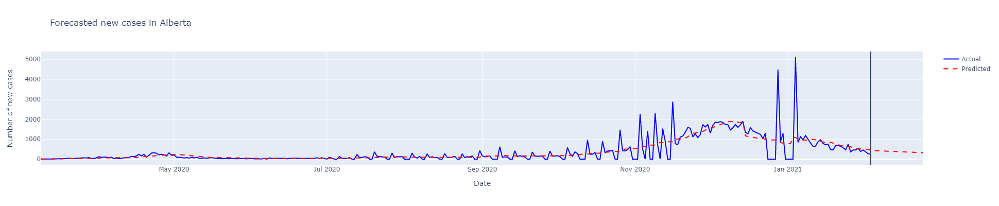

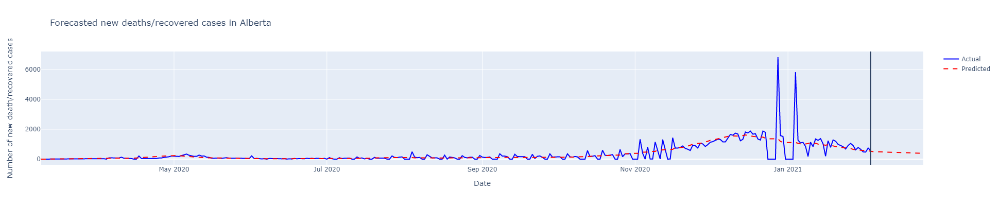

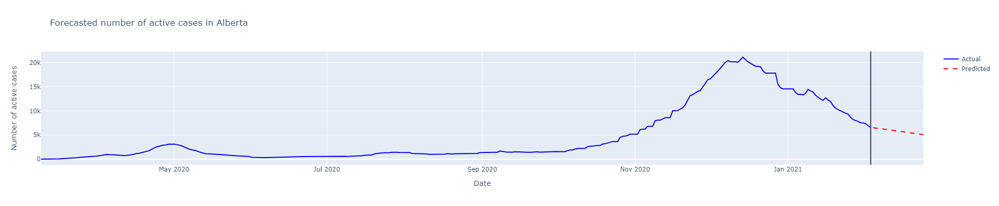

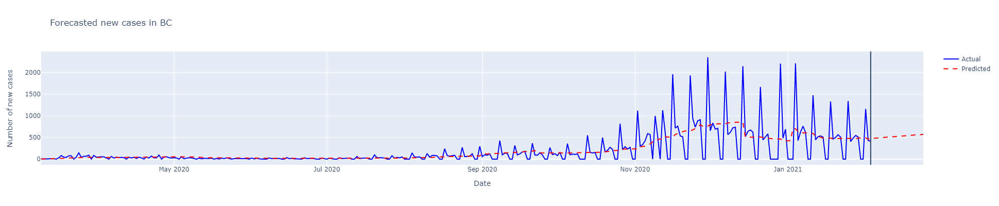

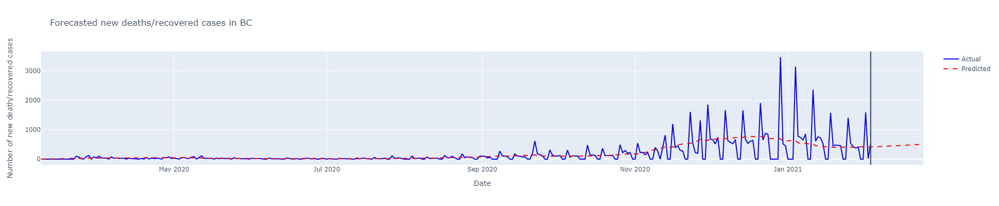

...

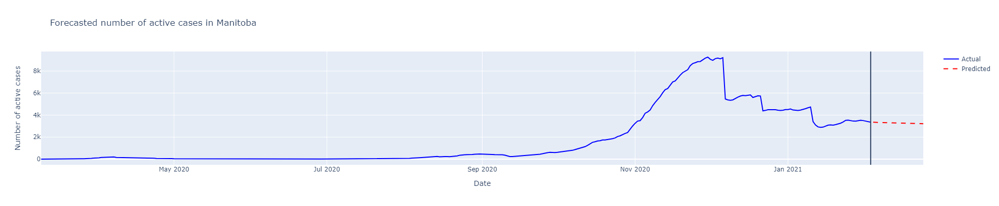

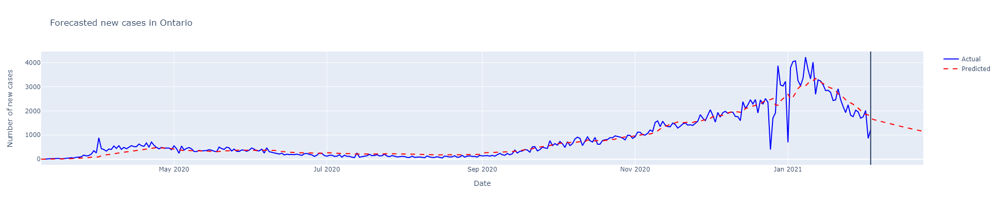

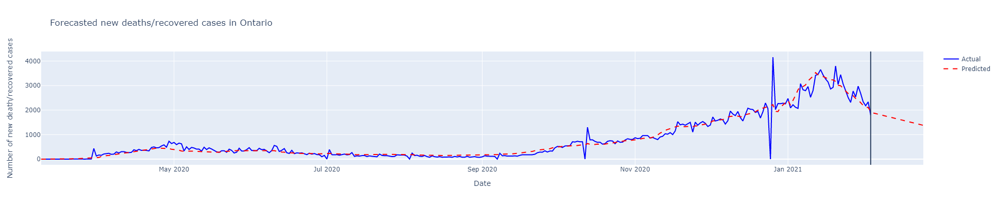

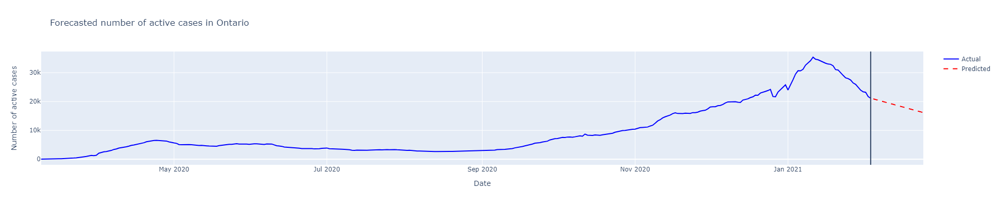

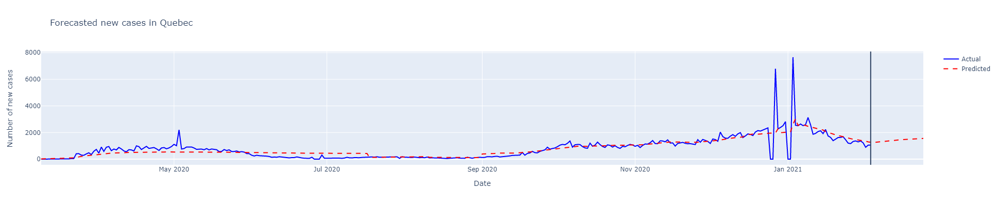

In [20]:
# Prediction plots for all provinces
for province in provinces:
    province_forecasts = forecasts.query('province == @province')
    
    plot_predictions(province_forecasts,
                     y = 'cases',
                     y_label = 'Number of new cases',
                     title = f'Forecasted new cases in {province}',
                     include_ci = False)

    plot_predictions(province_forecasts,
                     y = 'removed',
                     y_label = 'Number of new death/recovered cases',
                     title = f'Forecasted new deaths/recovered cases in {province}',
                     include_ci = False)
    
    plot_predictions(province_forecasts,
                     y = 'active_cases',
                     y_label = 'Number of active cases',
                     title = f'Forecasted number of active cases in {province}')

## Poisson regression with time varying parameters (intercept only)

Similar to the above poisson regression model except only intercept term \beta varies with time which more closely reflects how we want the corresponding SEIR model to be changed. This is defined for a simple example as shown

$$
Y_t \sim Poisson(\mu_t) \\
\text{If} ~~ t \leq c_1 \\
log(\mu_t) = \beta_{0,1} + \beta_{1}log(I_{t-1} + 1) + \beta_{2} log(S_{t-1}/N) \\
\text{else} \\
log(\mu_t) = \beta_{0,1} + \beta_{1}log(I_{t-1} + 1) + \beta_{2} log(S_{t-1}/N)
$$

and the new deaths/recovered modelled as 

$$
\Delta D_t \sim Poisson({\mu_t}^D) \\
log({\mu_t}^D) = \beta_{1}^D + \beta_{2}^D log(I_{t-1} + 1)
$$

In [15]:
# Preprocess all province data
active_cases_provinces_preprocessed = preprocess_data(active_cases_provinces, drop_first_day=True)

# Split date under different policies
date_splits = [date(year=2020, month=3, day=9), date(year=2020, month=9, day=1), date(year=2020, month=12, day=15), date(year=2021, month=1, day=3)]

In [16]:
# Fit model and get 3 week forecasts for each province for every province
h = 21
forecasts = pd.DataFrame()

for province in provinces:
    # Get province data
    province_data = active_cases_provinces_preprocessed.query('province == @province')
    X = province_data
    Y = province_data[['province', 'date', 'cases', 'removed']]
    
    # Fit model
    model = StemPoissonRegressor(date_splits = date_splits, cols_date_splits = ['intercept'])
    model.fit(X, Y)
    
    # Get forecasts
    province_forecasts = model.forecast(h=h)
    province_forecasts = province_forecasts.merge(province_data, how='left', on=['province', 'date'])
    forecasts = pd.concat([forecasts, province_forecasts], ignore_index=True)

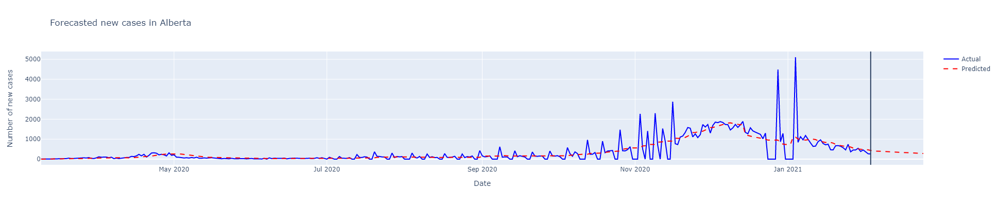

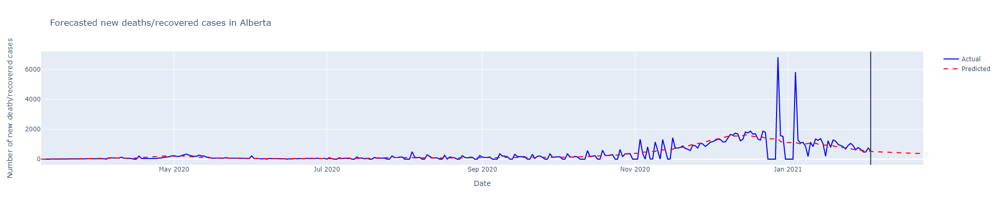

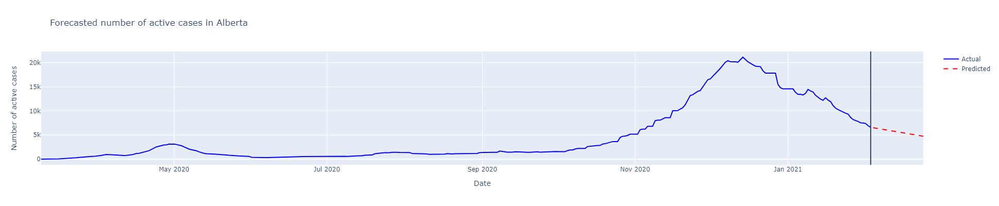

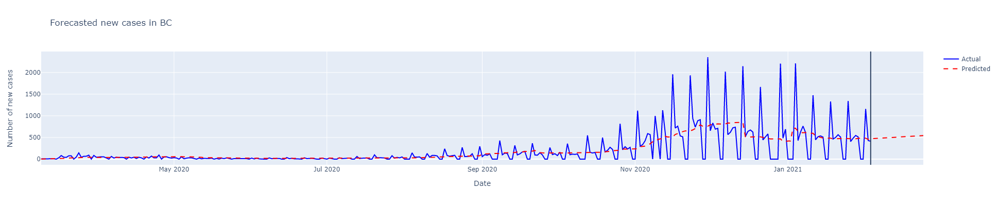

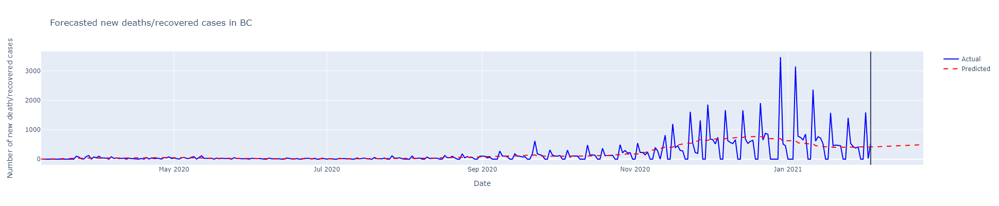

...

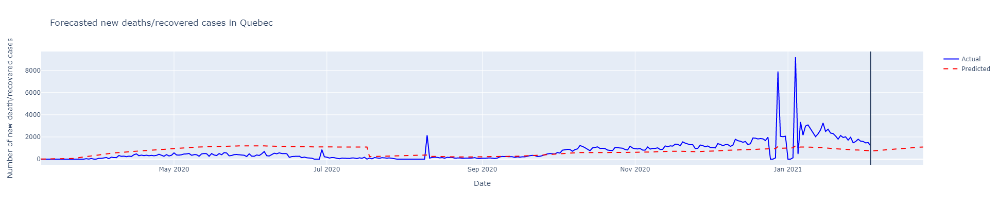

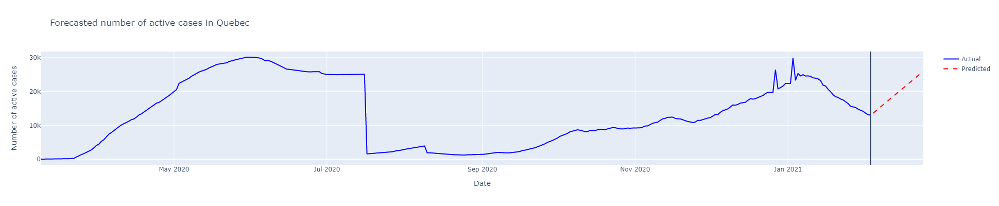

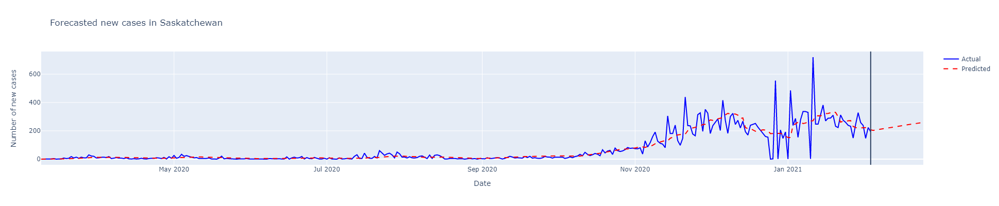

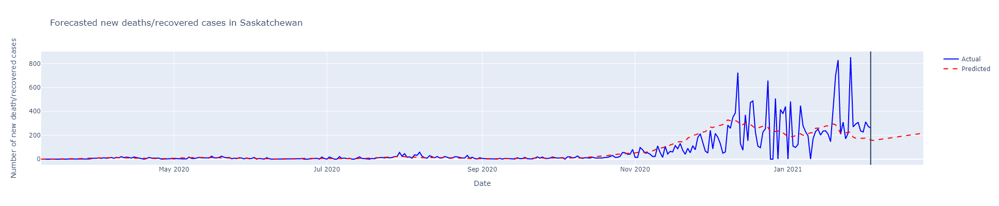

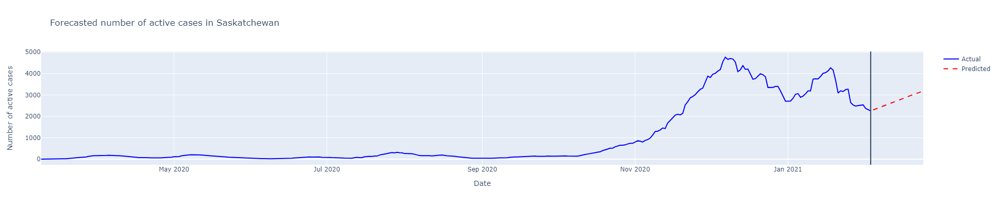

In [17]:
# Prediction plots for all provinces
for province in provinces:
    province_forecasts = forecasts.query('province == @province')
    
    plot_predictions(province_forecasts,
                     y = 'cases',
                     y_label = 'Number of new cases',
                     title = f'Forecasted new cases in {province}',
                     include_ci = False)

    plot_predictions(province_forecasts,
                     y = 'removed',
                     y_label = 'Number of new death/recovered cases',
                     title = f'Forecasted new deaths/recovered cases in {province}',
                     include_ci = False)
    
    plot_predictions(province_forecasts,
                     y = 'active_cases',
                     y_label = 'Number of active cases',
                     title = f'Forecasted number of active cases in {province}')

## Poisson regression with average cases over last k days

The data is quite noisy with some days having 0 cases which could be a result of the way the data is being reported. As well, there is some clear seasonality of 1 week as people tend to get tested on certain weekdays more than others. To handle this, we will try to use the average cases over the last k days instead to get a better estimate of the actual $I_{t-1}$ and $S_{t-1}$.

In [17]:
temp = active_cases_provinces.query('province == "Ontario"')

temp

,province,date,cumulative_cases,cumulative_recovered,cumulative_deaths,active_cases,active_cases_change,deaths,recovered,cases,population,removed,cumulative_removed,susceptible,percent_susceptible
945,Ontario,2020-03-08,32,4,0,28,4,0,0,4,14734014,0,4,14733982,0.999998
946,Ontario,2020-03-09,35,5,0,30,2,0,1,3,14734014,1,5,14733979,0.999998
947,Ontario,2020-03-10,37,5,0,32,2,0,0,2,14734014,0,5,14733977,0.999997
948,Ontario,2020-03-11,42,5,1,36,4,1,0,5,14734014,1,6,14733972,0.999997
949,Ontario,2020-03-12,59,5,1,53,17,0,0,17,14734014,0,6,14733955,0.999996
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1255,Ontario,2021-01-12,226658,186829,5139,34690,-725,64,3353,2692,14734014,3417,191968,14507356,0.984617
1256,Ontario,2021-01-13,229951,190221,5209,34521,-169,70,3392,3293,14734014,3462,195430,14504063,0.984393
1257,Ontario,2021-01-14,233193,193814,5268,34111,-410,59,3593,3242,14734014,3652,199082,14500821,0.984173
1258,Ontario,2021-01-15,236289,197194,5322,33773,-338,54,3380,3096,14734014,3434,202516,14497725,0.983963


## Cross validation

In [21]:
# Dataframe to store cross validation scores
k = 50
h_list = [1, 3, 5, 7, 14, 21]
responses = ['cases', 'removed']

cv_scores = pd.DataFrame()

### Poisson regression

In [22]:
%%time

# Preprocess all province data
active_cases_provinces_preprocessed = preprocess_data(active_cases_provinces, drop_first_day=True)

cv_scores_ = []

# Loop through each province and calculate cv scores
for province in provinces:
    # Split data
    province_data = active_cases_provinces_preprocessed.query("province == @province")
    X = province_data
    Y = province_data[['province', 'date', 'cases', 'removed']]
    
    # Fit model and calculate cv scores
    model = StemPoissonRegressor()    
    province_cv_scores = time_series_cross_val_scores(model, X, Y, responses, k = k, h_list = h_list)['summarised']
    province_cv_scores = province_cv_scores.assign(
        province = province,
        method = 'poisson_reg_linear'
    )
    
    cv_scores_.append(province_cv_scores)
    
cv_scores_ = pd.concat(cv_scores_)

cv_scores = pd.concat([cv_scores, cv_scores_])

Wall time: 28.5 s


### Poisson Regression Combined (Removed)

In [23]:
# # Preprocess data
# active_cases_provinces_preprocessed = preprocess_data(active_cases_provinces, add_province_columns=True, drop_first_day=True)
# X = active_cases_provinces_preprocessed
# Y = active_cases_provinces_preprocessed[['province', 'date', 'cases', 'removed']]

In [24]:
# %%time

# tscv = TimeSeriesSplit(n_splits=10)
# dates = active_cases_provinces_preprocessed['date'].unique()

# # loop through each province and each split based on dates
# for index, (train_index, test_index) in enumerate(tscv.split(dates)):
#     dates_train, dates_test = dates[train_index], dates[test_index]
    
#     # Split data into train and test
#     X_train, Y_train = X.query('date in @dates_train'), Y.query('date in @dates_train')
#     Y_test = Y.query('date in @dates_test')

#     # Fit model to train 
#     model = StemPoissonRegressorCombined(lam_main=0.6, lam_other=100)
#     model.fit(X_train, Y_train)        

#     # Calculate test fold rmse for both cases and removed for each province
#     forecasts = model.forecast(h = test_index.shape[0]).query('date in @dates_test')
    
#     for province in provinces:
#         province_forecasts = forecasts.query('province == @province')
#         Y_test_province = Y_test.query('province == @province')
#         cases_rmse = mean_squared_error(province_forecasts['cases_pred'], Y_test_province['cases'], squared=False)
#         removed_rmse = mean_squared_error(province_forecasts['removed_pred'], Y_test_province['removed'], squared=False)

#         # Append results
#         cv_scores = cv_scores.append({'province': province, 'method': 'poisson_reg_combined_linear', 'response': 'cases', 'fold': index, 'rmse': cases_rmse}, ignore_index=True)
#         cv_scores = cv_scores.append({'province': province, 'method': 'poisson_reg_combined_linear', 'response': 'removed', 'fold': index, 'rmse': removed_rmse}, ignore_index=True)        

In [25]:
# # Average rmse scores
# cv_scores.query('method == "poisson_reg_combined_linear"').groupby(["province", 'response']).agg(
#     {"rmse": ["mean", "std", "min", "max"]}
# ).reset_index()

### Poisson Regression time varying parameters

In [26]:
%%time

# Preprocess all province data
active_cases_provinces_preprocessed = preprocess_data(active_cases_provinces, drop_first_day=True)

date_splits = [date(year=2020, month=3, day=9), date(year=2020, month=9, day=1), date(year=2020, month=12, day=15), date(year=2021, month=1, day=3)]

cv_scores_ = []

# Loop through each province and calculate cv scores
for province in provinces:
    # Split data
    province_data = active_cases_provinces_preprocessed.query("province == @province")
    X = province_data
    Y = province_data[['province', 'date', 'cases', 'removed']]
    
    # Fit model and calculate cv scores
    model = StemPoissonRegressor(date_splits=date_splits)    
    province_cv_scores = time_series_cross_val_scores(model, X, Y, responses, k = k, h_list = h_list)['summarised']
    province_cv_scores = province_cv_scores.assign(
        province = province,
        method = 'poisson_reg_linear_time_varying_params'
    )
    
    cv_scores_.append(province_cv_scores)
    
cv_scores_ = pd.concat(cv_scores_)

cv_scores = pd.concat([cv_scores, cv_scores_])

Wall time: 29.1 s


### Poisson Regression time varying parameters (intercept)

In [27]:
%%time

# Preprocess all province data
active_cases_provinces_preprocessed = preprocess_data(active_cases_provinces, drop_first_day=True)

date_splits = [date(year=2020, month=3, day=9), date(year=2020, month=9, day=1), date(year=2020, month=12, day=15), date(year=2021, month=1, day=3)]

cv_scores_ = []

# Loop through each province and calculate cv scores
for province in provinces:
    # Split data
    province_data = active_cases_provinces_preprocessed.query("province == @province")
    X = province_data
    Y = province_data[['province', 'date', 'cases', 'removed']]
    
    # Fit model and calculate cv scores
    model = StemPoissonRegressor(date_splits=date_splits, cols_date_splits = ['intercept'])    
    province_cv_scores = time_series_cross_val_scores(model, X, Y, responses, k = k, h_list = h_list)['summarised']
    province_cv_scores = province_cv_scores.assign(
        province = province,
        method = 'poisson_reg_linear_time_varying_params_intercept'
    )
    
    cv_scores_.append(province_cv_scores)
    
cv_scores_ = pd.concat(cv_scores_)

cv_scores = pd.concat([cv_scores, cv_scores_])

Wall time: 28.4 s


### Comparison of different models

In [28]:
# Save results
cv_scores.to_csv("../models/poisson_regression_val_scores.csv", index=False)

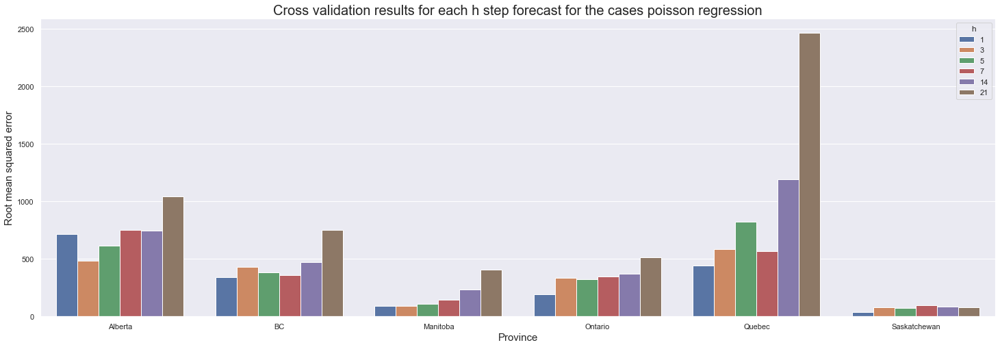

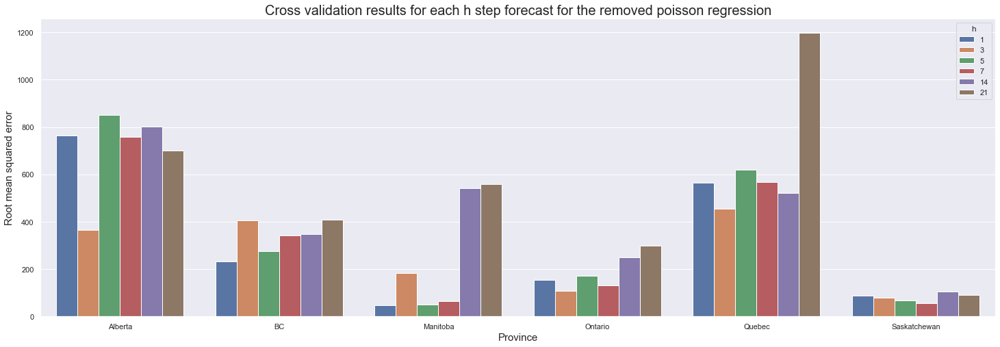

In [29]:
# Poisson regression 

fig = plt.figure(figsize=(25, 8))
ax = sns.barplot(
    x="province", y="rmse", hue="h", data=cv_scores.query('method == "poisson_reg_linear" and response == "cases"')
)
t = ax.set_title("Cross validation results for each h step forecast for the cases poisson regression", fontsize=20)
t = ax.set_ylabel("Root mean squared error", fontsize=15)
t = ax.set_xlabel("Province", fontsize=15)

fig = plt.figure(figsize=(25, 8))
ax = sns.barplot(
    x="province", y="rmse", hue="h", data=cv_scores.query('method == "poisson_reg_linear" and response == "removed"')
)
t = ax.set_title("Cross validation results for each h step forecast for the removed poisson regression", fontsize=20)
t = ax.set_ylabel("Root mean squared error", fontsize=15)
t = ax.set_xlabel("Province", fontsize=15)

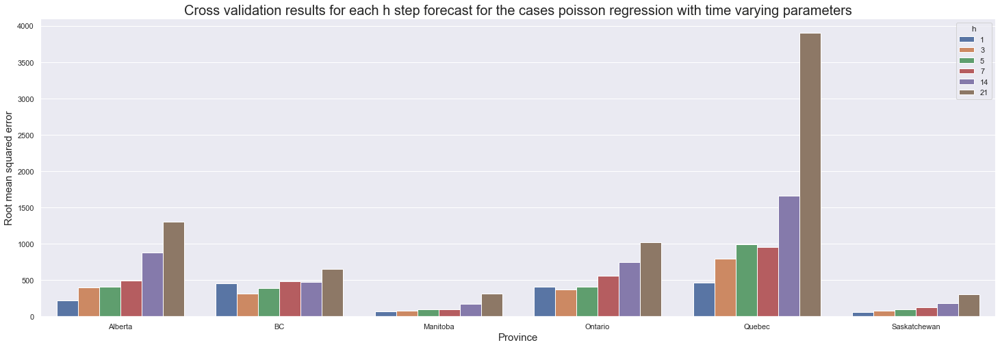

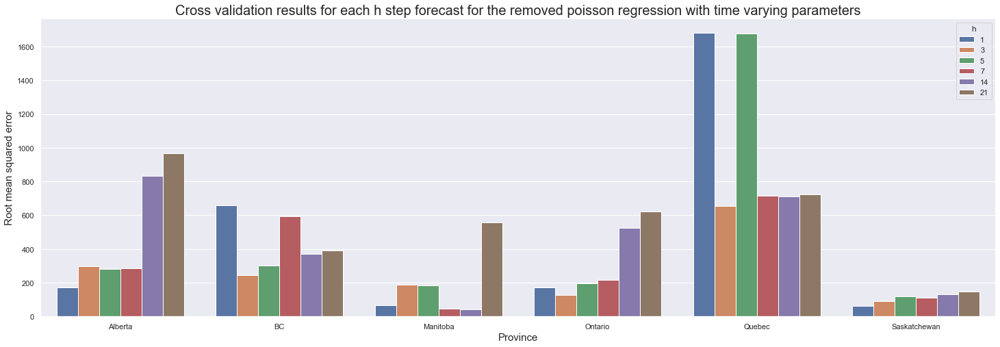

In [30]:
# Poisson regression with time varying parameters

fig = plt.figure(figsize=(25, 8))
ax = sns.barplot(
    x="province", y="rmse", hue="h", data=cv_scores.query('method == "poisson_reg_linear_time_varying_params" and response == "cases"')
)
t = ax.set_title("Cross validation results for each h step forecast for the cases poisson regression with time varying parameters", fontsize=20)
t = ax.set_ylabel("Root mean squared error", fontsize=15)
t = ax.set_xlabel("Province", fontsize=15)

fig = plt.figure(figsize=(25, 8))
ax = sns.barplot(
    x="province", y="rmse", hue="h", data=cv_scores.query('method == "poisson_reg_linear_time_varying_params" and response == "removed"')
)
t = ax.set_title("Cross validation results for each h step forecast for the removed poisson regression with time varying parameters", fontsize=20)
t = ax.set_ylabel("Root mean squared error", fontsize=15)
t = ax.set_xlabel("Province", fontsize=15)

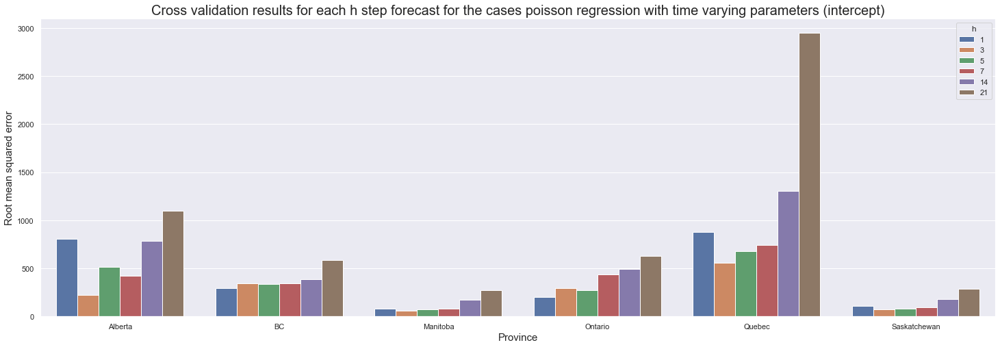

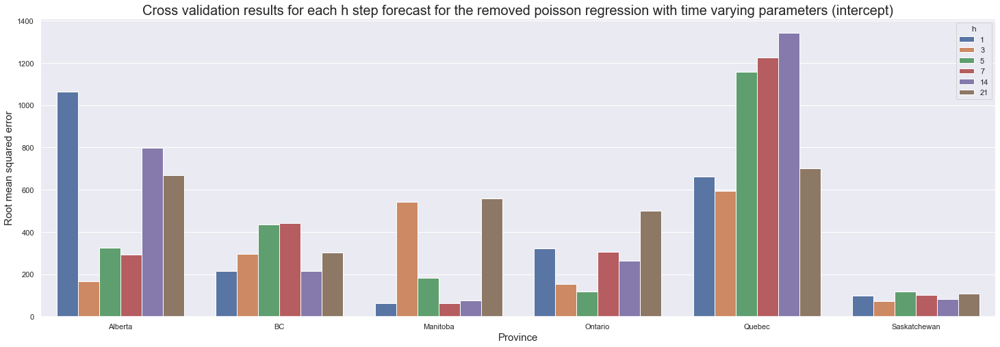

In [31]:
# Poisson regression with time varying parameters

fig = plt.figure(figsize=(25, 8))
ax = sns.barplot(
    x="province", y="rmse", hue="h", data=cv_scores.query('method == "poisson_reg_linear_time_varying_params_intercept" and response == "cases"')
)
t = ax.set_title("Cross validation results for each h step forecast for the cases poisson regression with time varying parameters (intercept)", fontsize=20)
t = ax.set_ylabel("Root mean squared error", fontsize=15)
t = ax.set_xlabel("Province", fontsize=15)

fig = plt.figure(figsize=(25, 8))
ax = sns.barplot(
    x="province", y="rmse", hue="h", data=cv_scores.query('method == "poisson_reg_linear_time_varying_params_intercept" and response == "removed"')
)
t = ax.set_title("Cross validation results for each h step forecast for the removed poisson regression with time varying parameters (intercept)", fontsize=20)
t = ax.set_ylabel("Root mean squared error", fontsize=15)
t = ax.set_xlabel("Province", fontsize=15)

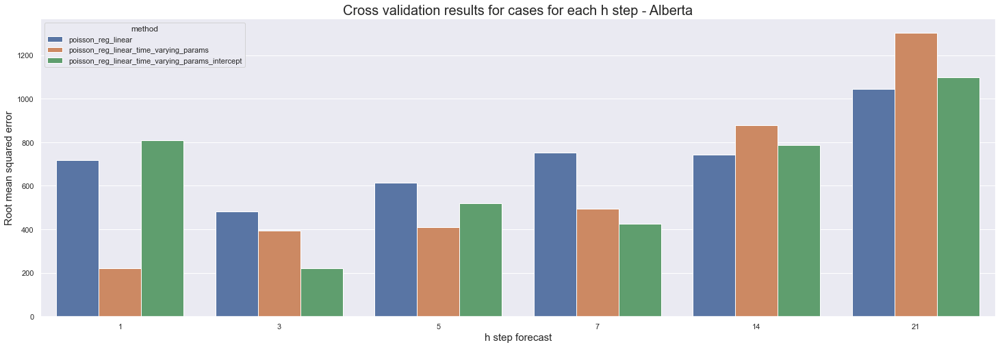

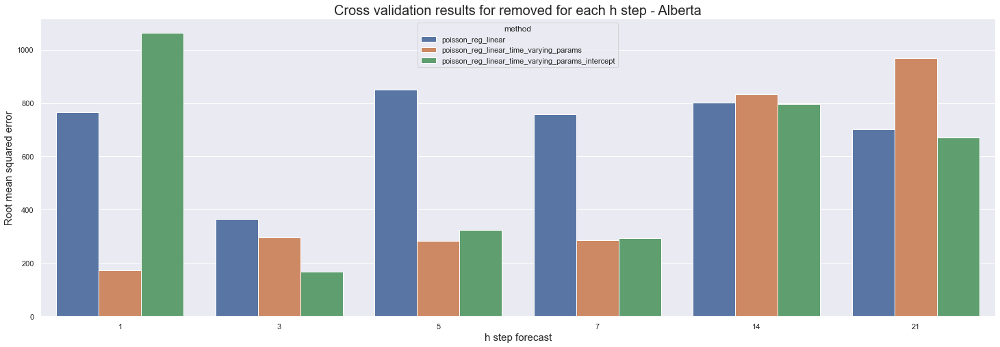

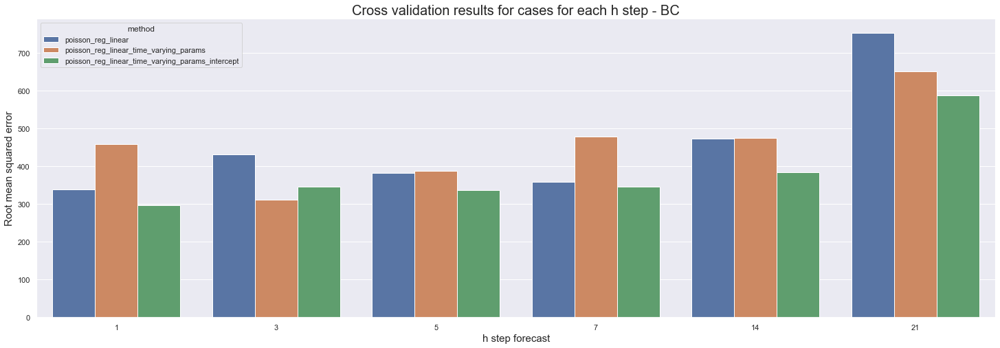

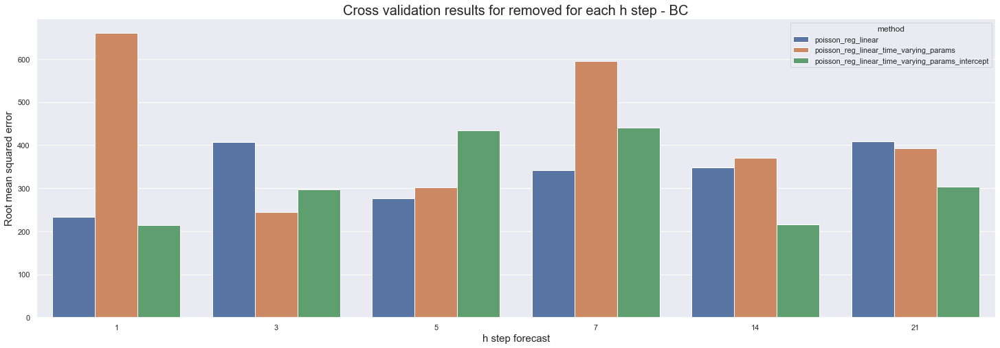

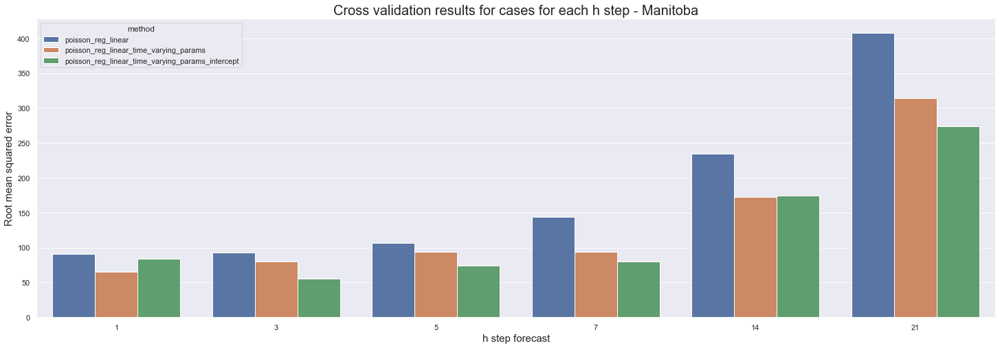

...

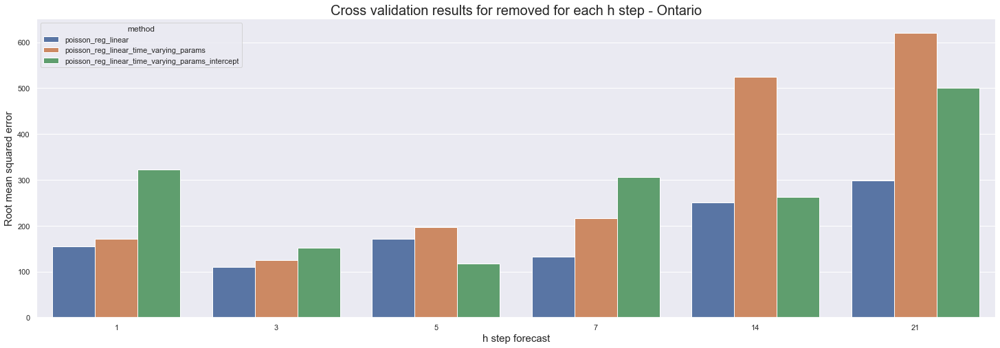

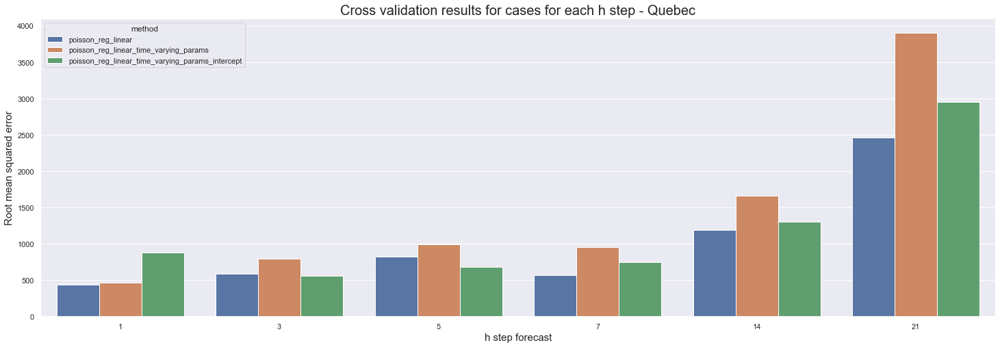

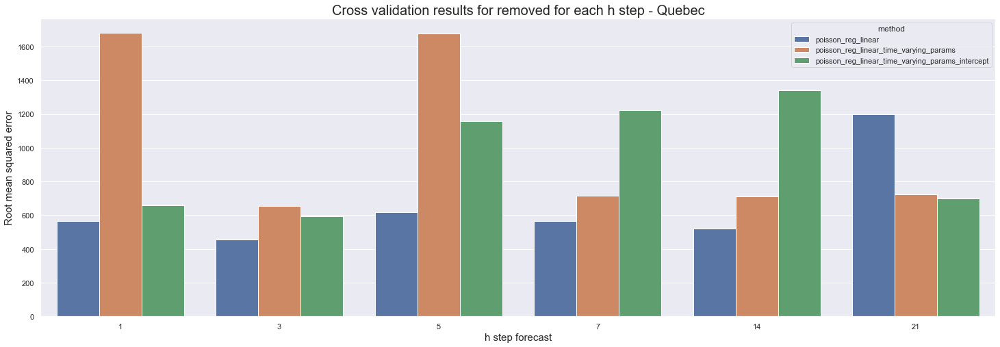

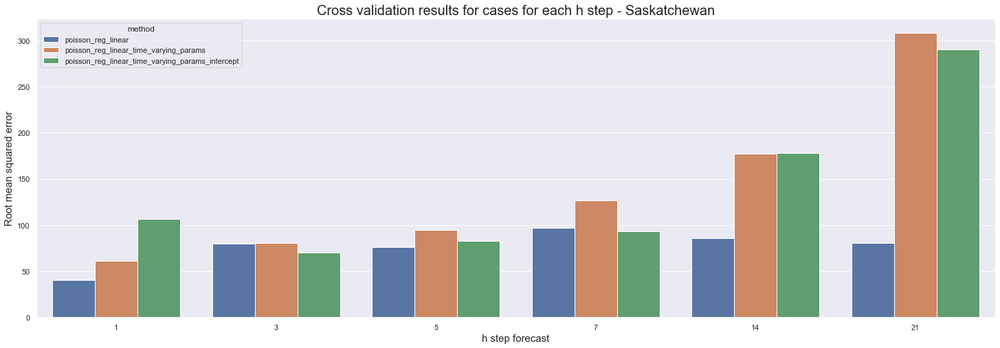

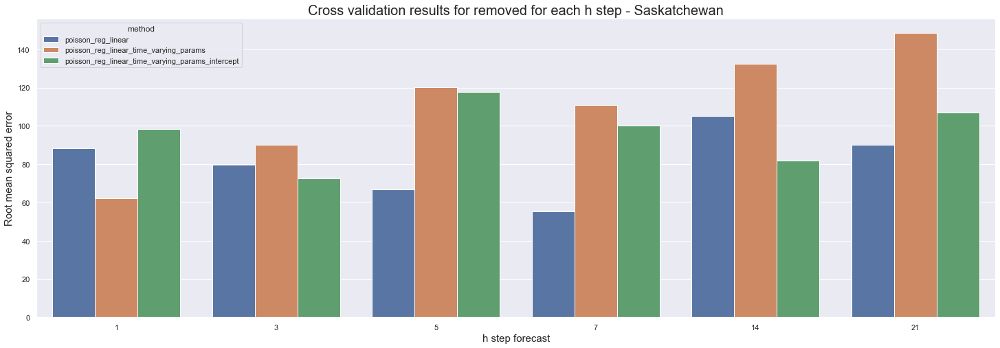

In [32]:
# Comparison between all methods

for province in provinces:
    fig = plt.figure(figsize=(25, 8))
    ax = sns.barplot(
        x="h", y="rmse", hue="method", data=cv_scores.query('province == @province and response == "cases"'), errwidth=0
    )
    t = ax.set_title(f"Cross validation results for cases for each h step - {province}", fontsize=20)
    t = ax.set_ylabel("Root mean squared error", fontsize=15)
    t = ax.set_xlabel("h step forecast", fontsize=15)

    fig = plt.figure(figsize=(25, 8))
    ax = sns.barplot(
        x="h", y="rmse", hue="method", data=cv_scores.query('province == @province and response == "removed"'), errwidth=0
    )
    t = ax.set_title(f"Cross validation results for removed for each h step - {province}", fontsize=20)
    t = ax.set_ylabel("Root mean squared error", fontsize=15)
    t = ax.set_xlabel("h step forecast", fontsize=15)